In [2]:
#!pip install pycaret
#!pip install tpot
#!pip install -U pandas_profiling

In [39]:
!pip install -U pandas

Requirement already up-to-date: pandas in /usr/local/lib/python3.6/dist-packages (1.1.2)


In [43]:
#confere as versões e os pacotes instalados
#pip list

# SPOTIFY - ANÁLISE EXPLORATÓRIA

## Importando as bibliotecas

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


## Lendo os dados

In [31]:
data = pd.read_csv('data.csv')
data_by_artist = pd.read_csv('data_by_artist.csv')
data_by_genres = pd.read_csv('data_by_genres.csv')
data_by_year = pd.read_csv('data_by_year.csv')
data_w_genres = pd.read_csv('data_w_genres.csv')


In [15]:
#vendo o data
data.head(1)

,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo,valence,year
0,0.995,['Carl Woitschach'],0.708,158648,0.195,0,6KbQ3uYMLKb5jDxLF7wYDD,0.563,10,0.151,-12.428,1,Singende Bataillone 1. Teil,0,1928,0.0506,118.469,0.779,1928


In [14]:
#por artista
data_by_artist.head(1)

,artists,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key,mode,count
0,"""Cats"" 1981 Original London Cast",0.575083,0.44275,247260.0,0.386336,0.022717,0.287708,-14.205417,0.180675,115.9835,0.334433,38.0,5,1,12


In [13]:
#por gênero
data_by_genres.head(1)

,genres,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key,mode
0,432hz,0.49478,0.299333,1.048887e+06,0.450678,0.477762,0.131,-16.854,0.076817,120.285667,0.22175,52.166667,5,1


In [12]:
#por ano
data_by_year.head(1)

,year,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key,mode
0,1921,0.895823,0.425661,229911.914062,0.236784,0.32233,0.215814,-17.095437,0.077258,100.397758,0.425495,0.351562,7,1


In [11]:
data_w_genres.head(1)

,artists,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key,mode,count,genres
0,"""Cats"" 1981 Original London Cast",0.575083,0.44275,247260.0,0.386336,0.022717,0.287708,-14.205417,0.180675,115.9835,0.334433,38.0,5,1,12,['show tunes']


## Visualizando as colunas

In [16]:
#do data:
data.columns

Index(['acousticness', 'artists', 'danceability', 'duration_ms', 'energy',
       'explicit', 'id', 'instrumentalness', 'key', 'liveness', 'loudness',
       'mode', 'name', 'popularity', 'release_date', 'speechiness', 'tempo',
       'valence', 'year'],
      dtype='object')

In [19]:
#por artista
data_by_artist.columns

Index(['artists', 'acousticness', 'danceability', 'duration_ms', 'energy',
       'instrumentalness', 'liveness', 'loudness', 'speechiness', 'tempo',
       'valence', 'popularity', 'key', 'mode', 'count'],
      dtype='object')

In [20]:
#por genero
data_by_genres.columns

Index(['genres', 'acousticness', 'danceability', 'duration_ms', 'energy',
       'instrumentalness', 'liveness', 'loudness', 'speechiness', 'tempo',
       'valence', 'popularity', 'key', 'mode'],
      dtype='object')

In [21]:
#por ano
data_by_year.columns

Index(['year', 'acousticness', 'danceability', 'duration_ms', 'energy',
       'instrumentalness', 'liveness', 'loudness', 'speechiness', 'tempo',
       'valence', 'popularity', 'key', 'mode'],
      dtype='object')

In [22]:
#com generos
data_w_genres.columns 

Index(['artists', 'acousticness', 'danceability', 'duration_ms', 'energy',
       'instrumentalness', 'liveness', 'loudness', 'speechiness', 'tempo',
       'valence', 'popularity', 'key', 'mode', 'count', 'genres'],
      dtype='object')

## Analisando o "data"

In [23]:
#quantas linhas e colunas temos?
data.shape

(169909, 19)

In [26]:
#informações gerais
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 169909 entries, 0 to 169908
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   acousticness      169909 non-null  float64
 1   artists           169909 non-null  object 
 2   danceability      169909 non-null  float64
 3   duration_ms       169909 non-null  int64  
 4   energy            169909 non-null  float64
 5   explicit          169909 non-null  int64  
 6   id                169909 non-null  object 
 7   instrumentalness  169909 non-null  float64
 8   key               169909 non-null  int64  
 9   liveness          169909 non-null  float64
 10  loudness          169909 non-null  float64
 11  mode              169909 non-null  int64  
 12  name              169909 non-null  object 
 13  popularity        169909 non-null  int64  
 14  release_date      169909 non-null  object 
 15  speechiness       169909 non-null  float64
 16  tempo             16

In [32]:
#alterando a coluna com a data de lançamento da música com tipo data
data['release_date'] = pd.to_datetime(data.release_date)

In [33]:
#vendo se deu certo
data.head()

,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo,valence,year
0,0.995,['Carl Woitschach'],0.708,158648,0.1950,0,6KbQ3uYMLKb5jDxLF7wYDD,0.563,10,0.1510,-12.428,1,Singende Bataillone 1. Teil,0,1928-01-01,0.0506,118.469,0.7790,1928
1,0.994,"['Robert Schumann', 'Vladimir Horowitz']",0.379,282133,0.0135,0,6KuQTIu1KoTTkLXKrwlLPV,0.901,8,0.0763,-28.454,1,"Fantasiestücke, Op. 111: Più tosto lento",0,1928-01-01,0.0462,83.972,0.0767,1928
2,0.604,['Seweryn Goszczyński'],0.749,104300,0.2200,0,6L63VW0PibdM1HDSBoqnoM,0.000,5,0.1190,-19.924,0,Chapter 1.18 - Zamek kaniowski,0,1928-01-01,0.9290,107.177,0.8800,1928
3,0.995,['Francisco Canaro'],0.781,180760,0.1300,0,6M94FkXd15sOAOQYRnWPN8,0.887,1,0.1110,-14.734,0,Bebamos Juntos - Instrumental (Remasterizado),0,1928-09-25,0.0926,108.003,0.7200,1928
4,0.990,"['Frédéric Chopin', 'Vladimir Horowitz']",0.210,687733,0.2040,0,6N6tiFZ9vLTSOIxkj8qKrd,0.908,11,0.0980,-16.829,1,"Polonaise-Fantaisie in A-Flat Major, Op. 61",1,1928-01-01,0.0424,62.149,0.0693,1928


In [51]:
#copiando os dados para começar as transformações
dados = data.copy()

In [52]:
#inferindo o tipo de dado
dados.infer_objects()
dados.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 169909 entries, 0 to 169908
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   acousticness      169909 non-null  float64       
 1   artists           169909 non-null  object        
 2   danceability      169909 non-null  float64       
 3   duration_ms       169909 non-null  int64         
 4   energy            169909 non-null  float64       
 5   explicit          169909 non-null  int64         
 6   id                169909 non-null  object        
 7   instrumentalness  169909 non-null  float64       
 8   key               169909 non-null  int64         
 9   liveness          169909 non-null  float64       
 10  loudness          169909 non-null  float64       
 11  mode              169909 non-null  int64         
 12  name              169909 non-null  object        
 13  popularity        169909 non-null  int64         
 14  rele

In [57]:
#transformando uma string que aparenta ser uma lista numa lista de verdade
import ast
dados['artistas'] = [ast.literal_eval(artist) for artist in dados.artists]

In [58]:
dados.head()

,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo,valence,year,artistas
0,0.995,['Carl Woitschach'],0.708,158648,0.1950,0,6KbQ3uYMLKb5jDxLF7wYDD,0.563,10,0.1510,-12.428,1,Singende Bataillone 1. Teil,0,1928-01-01,0.0506,118.469,0.7790,1928,[Carl Woitschach]
1,0.994,"['Robert Schumann', 'Vladimir Horowitz']",0.379,282133,0.0135,0,6KuQTIu1KoTTkLXKrwlLPV,0.901,8,0.0763,-28.454,1,"Fantasiestücke, Op. 111: Più tosto lento",0,1928-01-01,0.0462,83.972,0.0767,1928,"[Robert Schumann, Vladimir Horowitz]"
2,0.604,['Seweryn Goszczyński'],0.749,104300,0.2200,0,6L63VW0PibdM1HDSBoqnoM,0.000,5,0.1190,-19.924,0,Chapter 1.18 - Zamek kaniowski,0,1928-01-01,0.9290,107.177,0.8800,1928,[Seweryn Goszczyński]
3,0.995,['Francisco Canaro'],0.781,180760,0.1300,0,6M94FkXd15sOAOQYRnWPN8,0.887,1,0.1110,-14.734,0,Bebamos Juntos - Instrumental (Remasterizado),0,1928-09-25,0.0926,108.003,0.7200,1928,[Francisco Canaro]
4,0.990,"['Frédéric Chopin', 'Vladimir Horowitz']",0.210,687733,0.2040,0,6N6tiFZ9vLTSOIxkj8qKrd,0.908,11,0.0980,-16.829,1,"Polonaise-Fantaisie in A-Flat Major, Op. 61",1,1928-01-01,0.0424,62.149,0.0693,1928,"[Frédéric Chopin, Vladimir Horowitz]"


In [61]:
#transformando a coluna artistas para que se torne um artista único e não uma lista
spotify = dados.explode('artistas').reset_index(drop=True)

In [62]:
spotify.shape

(225456, 20)

In [63]:
spotify.head()

,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo,valence,year,artistas
0,0.995,['Carl Woitschach'],0.708,158648,0.1950,0,6KbQ3uYMLKb5jDxLF7wYDD,0.563,10,0.1510,-12.428,1,Singende Bataillone 1. Teil,0,1928-01-01,0.0506,118.469,0.7790,1928,Carl Woitschach
1,0.994,"['Robert Schumann', 'Vladimir Horowitz']",0.379,282133,0.0135,0,6KuQTIu1KoTTkLXKrwlLPV,0.901,8,0.0763,-28.454,1,"Fantasiestücke, Op. 111: Più tosto lento",0,1928-01-01,0.0462,83.972,0.0767,1928,Robert Schumann
2,0.994,"['Robert Schumann', 'Vladimir Horowitz']",0.379,282133,0.0135,0,6KuQTIu1KoTTkLXKrwlLPV,0.901,8,0.0763,-28.454,1,"Fantasiestücke, Op. 111: Più tosto lento",0,1928-01-01,0.0462,83.972,0.0767,1928,Vladimir Horowitz
3,0.604,['Seweryn Goszczyński'],0.749,104300,0.2200,0,6L63VW0PibdM1HDSBoqnoM,0.000,5,0.1190,-19.924,0,Chapter 1.18 - Zamek kaniowski,0,1928-01-01,0.9290,107.177,0.8800,1928,Seweryn Goszczyński
4,0.995,['Francisco Canaro'],0.781,180760,0.1300,0,6M94FkXd15sOAOQYRnWPN8,0.887,1,0.1110,-14.734,0,Bebamos Juntos - Instrumental (Remasterizado),0,1928-09-25,0.0926,108.003,0.7200,1928,Francisco Canaro


In [69]:
len(spotify.columns)

20

In [70]:
#redefinindo a ordem das colunas
colunas = ['id','name','artists','artistas', 'release_date',
           'year','duration_ms','key','acousticness', 'danceability',
           'energy', 'instrumentalness','explicit','liveness',
           'loudness','mode','popularity','speechiness','tempo','valence']

In [71]:
len(colunas)

20

In [72]:
#alterando o dataset
spotify = spotify[colunas]

In [73]:
spotify.head()

,id,name,artists,artistas,release_date,year,duration_ms,key,acousticness,danceability,energy,instrumentalness,explicit,liveness,loudness,mode,popularity,speechiness,tempo,valence
0,6KbQ3uYMLKb5jDxLF7wYDD,Singende Bataillone 1. Teil,['Carl Woitschach'],Carl Woitschach,1928-01-01,1928,158648,10,0.995,0.708,0.1950,0.563,0,0.1510,-12.428,1,0,0.0506,118.469,0.7790
1,6KuQTIu1KoTTkLXKrwlLPV,"Fantasiestücke, Op. 111: Più tosto lento","['Robert Schumann', 'Vladimir Horowitz']",Robert Schumann,1928-01-01,1928,282133,8,0.994,0.379,0.0135,0.901,0,0.0763,-28.454,1,0,0.0462,83.972,0.0767
2,6KuQTIu1KoTTkLXKrwlLPV,"Fantasiestücke, Op. 111: Più tosto lento","['Robert Schumann', 'Vladimir Horowitz']",Vladimir Horowitz,1928-01-01,1928,282133,8,0.994,0.379,0.0135,0.901,0,0.0763,-28.454,1,0,0.0462,83.972,0.0767
3,6L63VW0PibdM1HDSBoqnoM,Chapter 1.18 - Zamek kaniowski,['Seweryn Goszczyński'],Seweryn Goszczyński,1928-01-01,1928,104300,5,0.604,0.749,0.2200,0.000,0,0.1190,-19.924,0,0,0.9290,107.177,0.8800
4,6M94FkXd15sOAOQYRnWPN8,Bebamos Juntos - Instrumental (Remasterizado),['Francisco Canaro'],Francisco Canaro,1928-09-25,1928,180760,1,0.995,0.781,0.1300,0.887,0,0.1110,-14.734,0,0,0.0926,108.003,0.7200


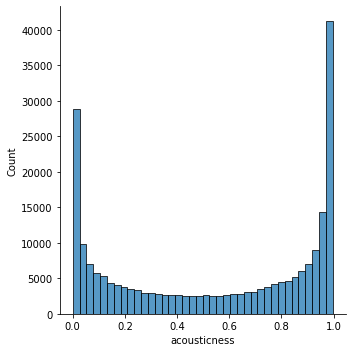

In [76]:
#vendo a distribuição da variável "acousticness"
sns.displot(spotify.acousticness);

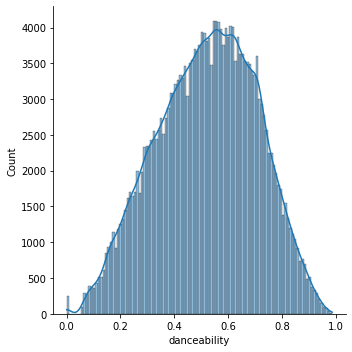

In [79]:
#vendo a distribuição da danceability
sns.displot(spotify.danceability, kde=True);

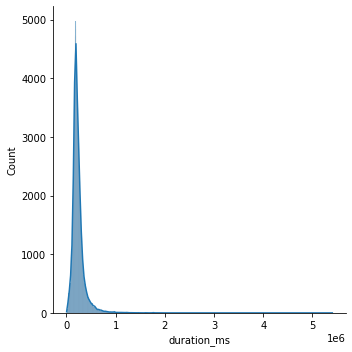

In [82]:
sns.displot(spotify.duration_ms, kde=True);

In [83]:
#criando uma coluna com a duração da música em segundos
duration_s = spotify.duration_ms/1000
#inserindo a coluna nova na posição 7 das colunas
spotify.insert(7,'duration_s',duration_s)

In [86]:
#criando uma coluna com a duração da música em minutos
duration_m = spotify.duration_s/60
#inserindo a coluna nova na posição 7 das colunas
spotify.insert(8,'duration_min',duration_m)

In [87]:
spotify.head()

,id,name,artists,artistas,release_date,year,duration_ms,duration_s,duration_min,key,acousticness,danceability,energy,instrumentalness,explicit,liveness,loudness,mode,popularity,speechiness,tempo,valence
0,6KbQ3uYMLKb5jDxLF7wYDD,Singende Bataillone 1. Teil,['Carl Woitschach'],Carl Woitschach,1928-01-01,1928,158648,158.648,2.644133,10,0.995,0.708,0.1950,0.563,0,0.1510,-12.428,1,0,0.0506,118.469,0.7790
1,6KuQTIu1KoTTkLXKrwlLPV,"Fantasiestücke, Op. 111: Più tosto lento","['Robert Schumann', 'Vladimir Horowitz']",Robert Schumann,1928-01-01,1928,282133,282.133,4.702217,8,0.994,0.379,0.0135,0.901,0,0.0763,-28.454,1,0,0.0462,83.972,0.0767
2,6KuQTIu1KoTTkLXKrwlLPV,"Fantasiestücke, Op. 111: Più tosto lento","['Robert Schumann', 'Vladimir Horowitz']",Vladimir Horowitz,1928-01-01,1928,282133,282.133,4.702217,8,0.994,0.379,0.0135,0.901,0,0.0763,-28.454,1,0,0.0462,83.972,0.0767
3,6L63VW0PibdM1HDSBoqnoM,Chapter 1.18 - Zamek kaniowski,['Seweryn Goszczyński'],Seweryn Goszczyński,1928-01-01,1928,104300,104.300,1.738333,5,0.604,0.749,0.2200,0.000,0,0.1190,-19.924,0,0,0.9290,107.177,0.8800
4,6M94FkXd15sOAOQYRnWPN8,Bebamos Juntos - Instrumental (Remasterizado),['Francisco Canaro'],Francisco Canaro,1928-09-25,1928,180760,180.760,3.012667,1,0.995,0.781,0.1300,0.887,0,0.1110,-14.734,0,0,0.0926,108.003,0.7200


In [85]:
#vendo os dados unicos de popularidade
spotify.popularity.unique()

array([  0,   1,   2,   3,   7,   6,   5,   4,   8,  14,  13,  11,  10,
        12,   9,  15,  19,  17,  18,  16,  20,  24,  21,  23,  22,  25,
        42,  28,  27,  37,  36,  35,  30,  26,  29,  44,  32,  33,  31,
        41,  46,  34,  45,  40,  38,  39,  54,  48,  58,  52,  47,  43,
        49,  51,  56,  55,  50,  57,  59,  66,  53,  61,  60,  62,  64,
        65,  69,  72,  63,  70,  68,  67,  71,  74,  75,  78,  81,  77,
        73,  80,  76,  79,  82,  83,  85,  84,  91,  92,  87,  86,  89,
        95,  93,  88,  90,  94,  99,  96, 100,  97])

## Rodando o sweetviz

In [91]:
#!pip install sweetviz

In [93]:
import sweetviz as sv

In [95]:
#criando um relatório do dataset geral
relatorio = sv.analyze(spotify)

:FEATURES DONE:                    |█████████████████████| [100%]   00:13  -> (00:00 left)
:PAIRWISE DONE:                    |█████████████████████| [100%]   00:04  -> (00:00 left)


Creating Associations graph... DONE!


In [97]:
#transformando em html
relatorio.show_html('report_spotify.html')

Report report_spotify.html was generated! NOTEBOOK/COLAB USERS: no browser will pop up, the report is saved in your notebook/colab files.


In [98]:
#criando relatórios para os demais datasets
relatorio_artista_genero = sv.analyze(data_w_genres)
relatorio_genero = sv.analyze(data_by_genres)
relatorio_ano = sv.analyze(data_by_year)


:FEATURES DONE:                    |█████████████████████| [100%]   00:07  -> (00:00 left)
:PAIRWISE DONE:                    |█████████████████████| [100%]   00:00  -> (00:00 left)


Creating Associations graph... 

:acousticness:                     |██▊                  | [ 13%]   00:00  -> (00:00 left)

DONE!


:FEATURES DONE:                    |█████████████████████| [100%]   00:07  -> (00:00 left)
:PAIRWISE DONE:                    |█████████████████████| [100%]   00:00  -> (00:00 left)


Creating Associations graph... 

:year:                             |█▍                   | [  7%]   00:00  -> (00:00 left)

DONE!


:FEATURES DONE:                    |█████████████████████| [100%]   00:06  -> (00:00 left)
:PAIRWISE DONE:                    |█████████████████████| [100%]   00:00  -> (00:00 left)


Creating Associations graph... DONE!


In [99]:
relatorio_artista_genero.show_html('relatorio_artista_genero.html')
relatorio_genero.show_html('relatorio_genero.html')
relatorio_ano.show_html('relatorio_ano.html')

Report relatorio_artista_genero.html was generated! NOTEBOOK/COLAB USERS: no browser will pop up, the report is saved in your notebook/colab files.
Report relatorio_genero.html was generated! NOTEBOOK/COLAB USERS: no browser will pop up, the report is saved in your notebook/colab files.
Report relatorio_ano.html was generated! NOTEBOOK/COLAB USERS: no browser will pop up, the report is saved in your notebook/colab files.


## Escolhendo as features e o alvo

In [100]:
#escolhidos pelo relatório gerado pelo sweetviz
features = ['year', 'acousticness', 'energy', 'loudness', 'danceability', 'instrumentalness', 'tempo']
label = 'popularity'

In [117]:
#fazendo um heatmap só com as features selecionadas
colunas = ['year', 'acousticness', 'energy', 'loudness', 'danceability', 'instrumentalness', 'tempo', 'popularity']
#correlação entre os dados escolhidos
corr1 = spotify[colunas].corr()

In [142]:
novos_dados = data[colunas]

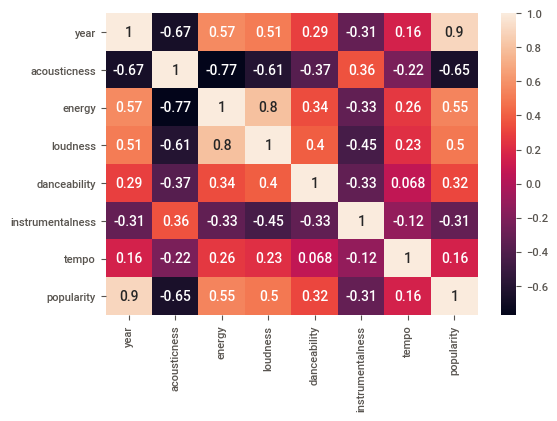

In [143]:
sns.heatmap(corr1, annot=True);

## Outras visualizações

In [107]:
#música mais populares
spotify.query('popularity == 100')

,id,name,artists,artistas,release_date,year,duration_ms,duration_s,duration_min,key,acousticness,danceability,energy,instrumentalness,explicit,liveness,loudness,mode,popularity,speechiness,tempo,valence
116878,0VjIjW4GlUZAMYd2vXMi3b,Blinding Lights,['The Weeknd'],The Weeknd,2020-03-20,2020,200040,200.04,3.334,1,0.00146,0.514,0.73,0.000095,0,0.0897,-5.934,1,100,0.0598,171.005,0.334


In [108]:
#músicas menos populares
spotify.loc[spotify.popularity == 0]

,id,name,artists,artistas,release_date,year,duration_ms,duration_s,duration_min,key,acousticness,danceability,energy,instrumentalness,explicit,liveness,loudness,mode,popularity,speechiness,tempo,valence
0,6KbQ3uYMLKb5jDxLF7wYDD,Singende Bataillone 1. Teil,['Carl Woitschach'],Carl Woitschach,1928-01-01,1928,158648,158.648,2.644133,10,0.995,0.708,0.1950,0.563000,0,0.1510,-12.428,1,0,0.0506,118.469,0.7790
1,6KuQTIu1KoTTkLXKrwlLPV,"Fantasiestücke, Op. 111: Più tosto lento","['Robert Schumann', 'Vladimir Horowitz']",Robert Schumann,1928-01-01,1928,282133,282.133,4.702217,8,0.994,0.379,0.0135,0.901000,0,0.0763,-28.454,1,0,0.0462,83.972,0.0767
2,6KuQTIu1KoTTkLXKrwlLPV,"Fantasiestücke, Op. 111: Più tosto lento","['Robert Schumann', 'Vladimir Horowitz']",Vladimir Horowitz,1928-01-01,1928,282133,282.133,4.702217,8,0.994,0.379,0.0135,0.901000,0,0.0763,-28.454,1,0,0.0462,83.972,0.0767
3,6L63VW0PibdM1HDSBoqnoM,Chapter 1.18 - Zamek kaniowski,['Seweryn Goszczyński'],Seweryn Goszczyński,1928-01-01,1928,104300,104.300,1.738333,5,0.604,0.749,0.2200,0.000000,0,0.1190,-19.924,0,0,0.9290,107.177,0.8800
4,6M94FkXd15sOAOQYRnWPN8,Bebamos Juntos - Instrumental (Remasterizado),['Francisco Canaro'],Francisco Canaro,1928-09-25,1928,180760,180.760,3.012667,1,0.995,0.781,0.1300,0.887000,0,0.1110,-14.734,0,0,0.0926,108.003,0.7200
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
225319,415Qh0jfE8ElFg7JaJ4MfF,Pobre Diabla,['Don Omar'],Don Omar,2020-06-05,2020,255680,255.680,4.261333,5,0.217,0.741,0.7870,0.017900,0,0.0835,-6.228,1,0,0.0525,91.993,0.7710
225324,2H60EiDMGTnzer2D8I6DMv,Aunque Es De Noche,['ROSALÍA'],ROSALÍA,2020-06-05,2020,253109,253.109,4.218483,4,0.913,0.698,0.2900,0.000021,0,0.0950,-6.899,0,0,0.0510,137.949,0.3980
225325,76WMWYa1iqRTHZotPuuEuc,Catalina,['ROSALÍA'],ROSALÍA,2020-06-05,2020,214012,214.012,3.566867,6,0.921,0.442,0.2670,0.000017,0,0.1210,-9.640,0,0,0.0582,78.171,0.3220
225360,3AMQUcKmht3G7PhvTJYuZ4,How Long Will I Love You,['Ellie Goulding'],Ellie Goulding,2020-06-05,2020,148689,148.689,2.478150,0,0.262,0.453,0.3160,0.000894,0,0.1350,-8.525,1,0,0.0316,125.628,0.1770


In [144]:
#describe das features selecionadas
novos_dados.describe()

,year,acousticness,energy,loudness,danceability,instrumentalness,tempo,popularity
count,169909.000000,169909.000000,169909.000000,169909.000000,169909.000000,169909.000000,169909.000000,169909.000000
mean,1977.223231,0.493214,0.488593,-11.370289,0.538150,0.161937,116.948017,31.556610
std,25.593168,0.376627,0.267390,5.666765,0.175346,0.309329,30.726937,21.582614
min,1921.000000,0.000000,0.000000,-60.000000,0.000000,0.000000,0.000000,0.000000
25%,1957.000000,0.094500,0.263000,-14.470000,0.417000,0.000000,93.516000,12.000000
50%,1978.000000,0.492000,0.481000,-10.474000,0.548000,0.000204,114.778000,33.000000
75%,1999.000000,0.888000,0.710000,-7.118000,0.667000,0.086800,135.712000,48.000000
max,2020.000000,0.996000,1.000000,3.855000,0.988000,1.000000,244.091000,100.000000


In [110]:
#músicas na mediana de popularidade
spotify[spotify.popularity == spotify.popularity.median()]

,id,name,artists,artistas,release_date,year,duration_ms,duration_s,duration_min,key,acousticness,danceability,energy,instrumentalness,explicit,liveness,loudness,mode,popularity,speechiness,tempo,valence
4473,1gzsqnh8JvzYwIIv2r0kiJ,Take Me In Your Arms And Love Me,['Gladys Knight & The Pips'],Gladys Knight & The Pips,1967-01-01,1967,174627,174.627,2.910450,0,0.5850,0.456,0.418,0.000000,0,0.1720,-11.666,1,31,0.0346,82.137,0.602
4474,27KGP8rDazv5kpSymLuCLS,Rubber Band,['David Bowie'],David Bowie,1967-06-01,1967,139400,139.400,2.323333,2,0.8260,0.726,0.312,0.000010,0,0.1230,-16.492,1,31,0.0725,125.776,0.461
4500,3bxBoOY0ykwzqtJS1fy0bs,Clarice - Remastered 2006,['Caetano Veloso'],Caetano Veloso,1967-01-01,1967,330227,330.227,5.503783,1,0.0162,0.383,0.322,0.000573,0,0.1640,-13.175,0,31,0.0356,106.009,0.287
4501,5BbOZqb6pntaF0II6Xul0r,When Summer Is Gone,['Gary Lewis & The Playboys'],Gary Lewis & The Playboys,1967-01-01,1967,147920,147.920,2.465333,0,0.6310,0.624,0.284,0.000000,0,0.3090,-11.339,1,31,0.0269,93.775,0.576
4509,2GQHVd0VrJnQ0h3eKAfh1h,Reach Out For Me,['Burt Bacharach'],Burt Bacharach,1967-01-01,1967,170773,170.773,2.846217,5,0.2300,0.629,0.330,0.707000,0,0.1240,-16.697,1,31,0.0308,112.240,0.677
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
221508,4crZIDgFUaBoeyj2KbD5j3,The Knowledge,['Janet Jackson'],Janet Jackson,1989-09-19,1989,233267,233.267,3.887783,8,0.0205,0.766,0.698,0.188000,0,0.3430,-8.132,1,31,0.0981,107.117,0.720
221510,4ijVfb64BvoN3ju3DlCc8v,Someday Is Tonight,['Janet Jackson'],Janet Jackson,1989-09-19,1989,361240,361.240,6.020667,8,0.1990,0.572,0.450,0.000103,0,0.0497,-10.464,1,31,0.0323,81.975,0.111
221524,55ZMyYbRQRYjcNWceCL5oT,The Miracle - Remastered 2011,['Queen'],Queen,1989-05-22,1989,301360,301.360,5.022667,1,0.1560,0.477,0.651,0.000000,0,0.5540,-6.021,1,31,0.0270,92.140,0.539
221639,0r8qPb5K6uCZSEynJoGkJd,Run Silent Run Deep - 2015 Remaster,['Iron Maiden'],Iron Maiden,1990-10-01,1990,274800,274.800,4.580000,4,0.1100,0.324,0.914,0.000005,0,0.1070,-4.680,0,31,0.1020,116.741,0.406


In [111]:
#qual a popularidade mais frequente: provavelmente o 0
spotify.popularity.mode()

0    0
dtype: int64

In [113]:
spotify_populares = data.query('popularity > 0')

In [114]:
spotify_populares.shape

(142552, 19)

In [115]:
#correlação entre os dados escolhidos
corr = spotify_populares[colunas].corr()

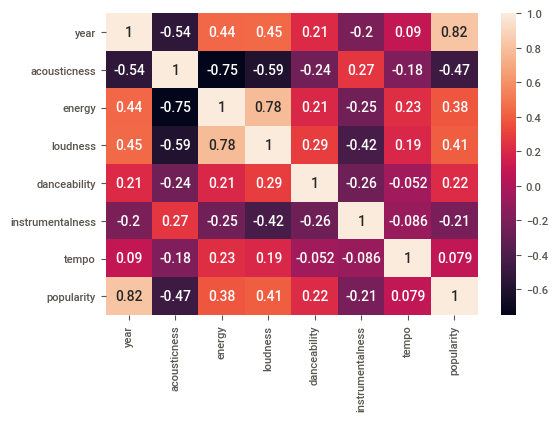

In [120]:
sns.heatmap(corr, annot=True);


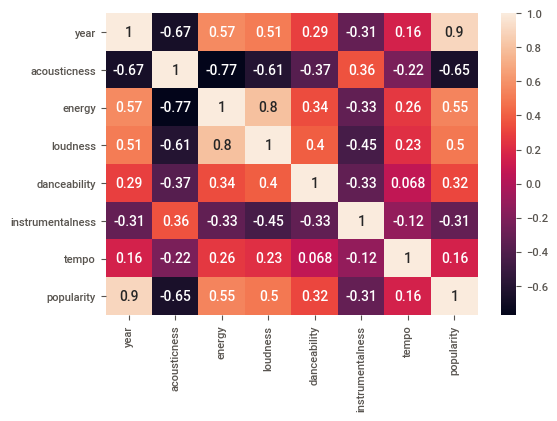

In [121]:
sns.heatmap(corr1, annot=True);

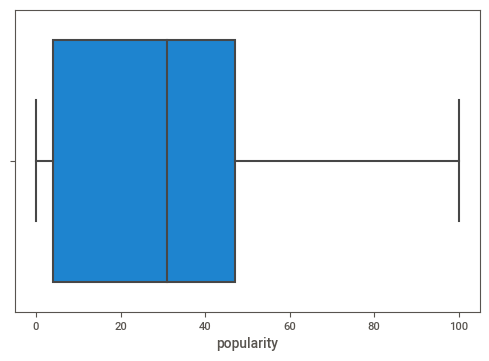

In [124]:
#boxplot popularidade antes de retirar os 0
sns.boxplot(x= spotify.popularity);


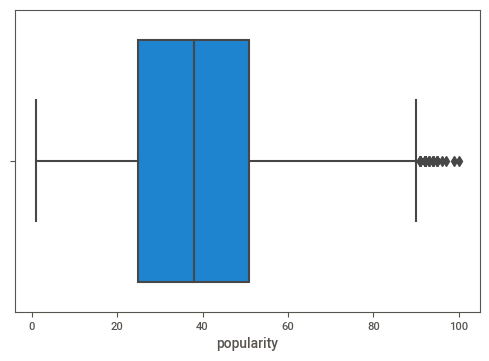

In [126]:
#boxplot popularidade depois de retirar os 0
sns.boxplot(x=spotify_populares.popularity);

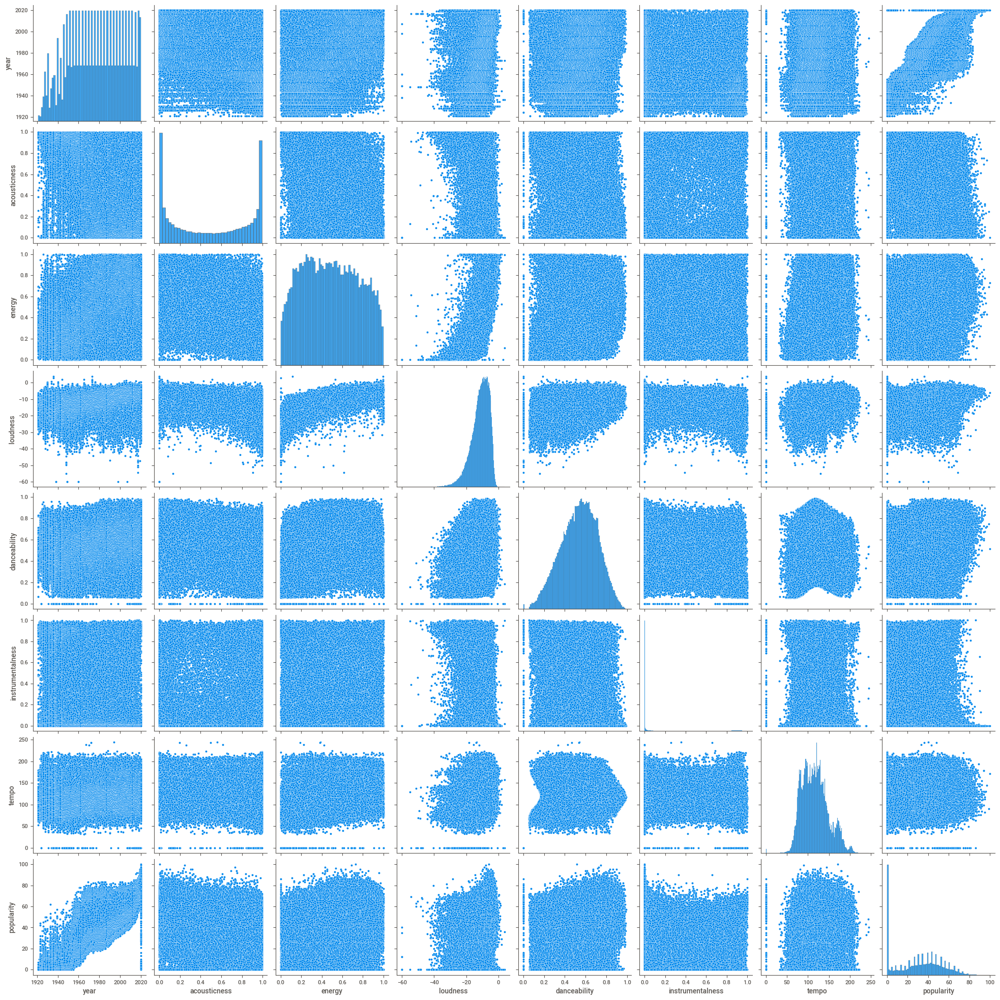

In [145]:
#fazendo um pairplot com as features escolhidas
sns.pairplot(novos_dados);

# MODELO PREDITIVO - PREVENDO A POPULARIDADE

## Criando um modelo de regressão simples

In [146]:
dados_modelo = sm.add_constant(novos_dados, prepend=False)

In [147]:
dados_modelo.head()

,year,acousticness,energy,loudness,danceability,instrumentalness,tempo,popularity,const
0,1928,0.995,0.1950,-12.428,0.708,0.563,118.469,0,1.0
1,1928,0.994,0.0135,-28.454,0.379,0.901,83.972,0,1.0
2,1928,0.604,0.2200,-19.924,0.749,0.000,107.177,0,1.0
3,1928,0.995,0.1300,-14.734,0.781,0.887,108.003,0,1.0
4,1928,0.990,0.2040,-16.829,0.210,0.908,62.149,1,1.0


In [148]:
#dividindo os dados entre variáveis explicativas e target
X = dados_modelo.drop('popularity', axis=1)
y = dados_modelo.popularity

In [149]:
#criando o modelo do statsmodels para regressão linear
regressao = sm.OLS(y,X)
res = regressao.fit()

In [150]:
print(res.summary())

                            OLS Regression Results                            
Dep. Variable:             popularity   R-squared:                       0.781
Model:                            OLS   Adj. R-squared:                  0.781
Method:                 Least Squares   F-statistic:                 8.650e+04
Date:                Sat, 03 Oct 2020   Prob (F-statistic):               0.00
Time:                        23:50:55   Log-Likelihood:            -6.3406e+05
No. Observations:              169909   AIC:                         1.268e+06
Df Residuals:                  169901   BIC:                         1.268e+06
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
year                 0.6987      0.001  

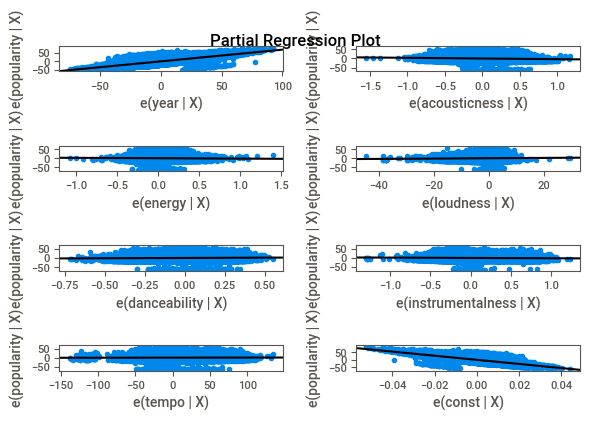

In [169]:
#plot da regressão
fig = sm.graphics.plot_partregress_grid(res)

## Dividindo entre treino e teste

In [151]:
from sklearn.model_selection import train_test_split

In [155]:
#recriando meu X e y sem constante para os demais algoritmos
X = novos_dados.drop('popularity', axis=1)
y = novos_dados.popularity

In [156]:
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state = 42)

## Testando modelos de regressão do Sci_Kit

### Bayesian Ridge

In [157]:
from sklearn.linear_model import BayesianRidge

In [158]:
#cria o modelo
modelo_v1 = BayesianRidge()

In [159]:
#ajusta o modelo aos dados de treino
modelo_v1.fit(X_train,y_train)

BayesianRidge()

In [160]:
#faz as predições
y_pred_1 = modelo_v1.predict(X_test)

In [161]:
#avaliação do modelo
from sklearn.metrics import explained_variance_score, mean_squared_error, r2_score

In [163]:
#média quadrada do erro
mean_squared_error(y_test, y_pred_1)

103.32383070985004

In [164]:
#score de variância explicada
explained_variance_score(y_test, y_pred_1)

0.7787212467957598

In [165]:
#R2
r2_score(y_test,y_pred_1)

0.7787152296700262

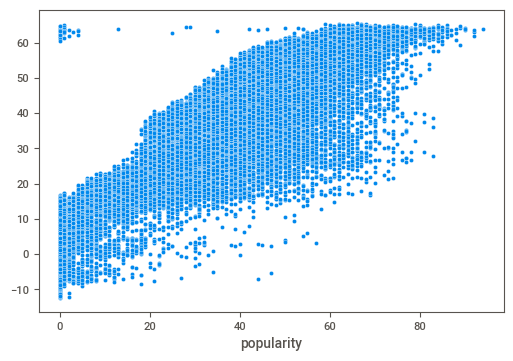

In [180]:
#rodando um scatterplot entre o y_true e nossa previsão
sns.scatterplot(x=y_test,y=y_pred_1);

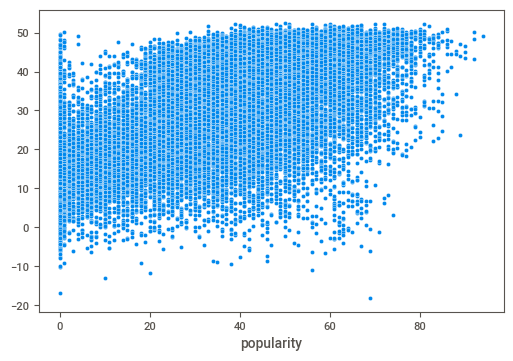

In [183]:
#rodando um scatterplot entre o y_true e nossa previsão
sns.scatterplot(x=y_test,y=y_pred_2);

### LinearSVR

In [170]:
from sklearn.svm import LinearSVR

In [175]:
modelo_v2 = LinearSVR(max_iter=10000)

In [176]:
modelo_v2.fit(X_train, y_train)

/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py:977: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


LinearSVR(max_iter=10000)

In [181]:
#previsão 2
y_pred_2 = modelo_v2.predict(X_test)

In [182]:
#avalia o modelo
#média quadrada do erro
print(mean_squared_error(y_test, y_pred_2))
#score de variância explicada
print(explained_variance_score(y_test, y_pred_2))
#r2
print(r2_score(y_test, y_pred_2))


269.3917984846493
0.4343389846857493
0.42305369587142805


## Escolhendo modelos com o PyCaret

In [141]:
from pycaret.regression import *

In [185]:
setup(data=novos_dados, target='popularity', normalize=True, profile=True)

(            year  acousticness  ...  instrumentalness     tempo
 0      -1.923301      1.332319  ...          1.296562  0.049500
 1      -1.923301      1.329664  ...          2.389253 -1.073199
 2      -1.923301      0.294154  ...         -0.523513 -0.317996
 3      -1.923301      1.332319  ...          2.343994 -0.291114
 4      -1.923301      1.319044  ...          2.411883 -1.783425
 ...          ...           ...  ...               ...       ...
 169904  1.671419     -0.850217  ...         -0.523408 -0.551180
 169905  1.671419     -1.265218  ...         -0.422326  0.359685
 169906  1.671419      0.118914  ...         -0.515980  0.219742
 169907  1.671419     -1.119981  ...         -0.523513  0.422041
 169908  1.671419     -1.020147  ...         -0.523513 -1.183331
 
 [169909 rows x 7 columns], 0          0.0
 1          0.0
 2          0.0
 3          0.0
 4          1.0
           ... 
 169904    75.0
 169905    64.0
 169906    70.0
 169907    70.0
 169908    65.0
 Name: populari

In [190]:
compare_models(fold=5, exclude=['ransac','tr'])

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
0,CatBoost Regressor,6.5036,81.2044,9.0112,0.8253,0.5513,0.3202,15.7796
1,Light Gradient Boosting Machine,6.5202,81.6103,9.0337,0.8245,0.5542,0.3178,0.6376
2,Extreme Gradient Boosting,6.5894,82.6893,9.0932,0.8222,0.5790,0.3185,4.3537
3,Gradient Boosting Regressor,6.5890,82.6963,9.0936,0.8221,0.5789,0.3183,20.1954
4,Random Forest,6.6351,84.0920,9.1701,0.8191,0.5521,0.3316,54.5702
5,Extra Trees Regressor,6.6835,86.1912,9.2839,0.8146,0.5433,0.3311,18.1637
6,Support Vector Machine,6.8554,95.7319,9.7839,0.7941,0.6382,0.3292,593.7571
7,Linear Regression,7.7281,101.8613,10.0923,0.7809,0.8876,0.4404,0.0208
8,Ridge Regression,7.7282,101.8613,10.0923,0.7809,0.8876,0.4404,0.0114
9,Least Angle Regression,7.7281,101.8613,10.0923,0.7809,0.8876,0.4404,0.0159


In [192]:
catboost = create_model('catboost')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,6.4443,78.9315,8.8843,0.8298,0.5455,0.3287
1,6.4831,79.5814,8.9208,0.8279,0.5403,0.3134
2,6.5331,81.6465,9.0358,0.8255,0.5533,0.3129
3,6.5413,82.1748,9.0650,0.8242,0.5606,0.3243
4,6.6035,83.4796,9.1367,0.8204,0.5447,0.3270
5,6.4384,79.1670,8.8976,0.8309,0.5494,0.3180
6,6.5050,82.5550,9.0860,0.8221,0.5482,0.3131
7,6.4855,81.6688,9.0371,0.8255,0.5658,0.3127
8,6.5045,82.1150,9.0617,0.8236,0.5542,0.3175
9,6.4634,80.2665,8.9592,0.8244,0.5508,0.3266


In [193]:
tune_model(catboost)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,6.5206,80.2846,8.9602,0.8269,0.5734,0.3350
1,6.5552,80.7439,8.9858,0.8254,0.5628,0.3147
2,6.6245,83.0887,9.1153,0.8224,0.5765,0.3151
3,6.5972,83.0023,9.1106,0.8224,0.5831,0.3262
4,6.6820,84.8355,9.2106,0.8175,0.5679,0.3325
5,6.5265,80.3940,8.9663,0.8283,0.5727,0.3210
6,6.5776,83.9959,9.1649,0.8190,0.5740,0.3151
7,6.5755,83.4106,9.1329,0.8218,0.5904,0.3193
8,6.5809,82.9549,9.1080,0.8218,0.5813,0.3191
9,6.5397,81.5334,9.0296,0.8217,0.5731,0.3281


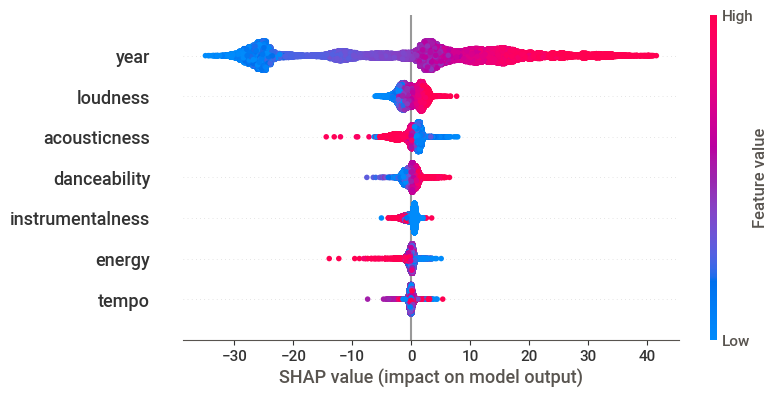

In [197]:
interpret_model(catboost)

In [198]:
#!pip install shap

In [199]:
lgbm = create_model('lightgbm')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,6.4560,79.3302,8.9067,0.8290,0.5496,0.3296
1,6.4982,79.8621,8.9366,0.8273,0.5432,0.3099
2,6.5643,82.3638,9.0754,0.8239,0.5554,0.3093
3,6.5388,82.0241,9.0567,0.8245,0.5625,0.3202
4,6.6135,83.8048,9.1545,0.8197,0.5493,0.3274
5,6.4449,79.1961,8.8992,0.8309,0.5495,0.3160
6,6.5116,82.8328,9.1013,0.8215,0.5493,0.3111
7,6.5124,82.4071,9.0778,0.8239,0.5662,0.3149
8,6.5333,82.4723,9.0814,0.8228,0.5606,0.3152
9,6.4903,80.8013,8.9890,0.8233,0.5530,0.3247


### Plots de regressão disponíveis no PyCaret


Name|	Plot
---|---
Residuals Plot|	‘residuals’
Prediction Error Plot|	‘error’
Cooks Distance Plot|	‘cooks’
Recursive Feature| Selection	‘rfe’
Learning Curve	|‘learning’
Validation Curve|	‘vc’
Manifold Learning|	‘manifold’
Feature Importance|	‘feature’
Model Hyperparameter|	‘parameter’

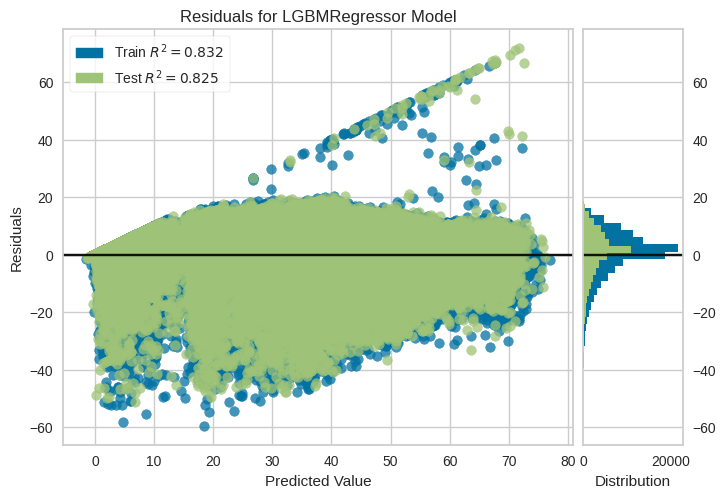

In [202]:
plot_model(lgbm,plot='residuals')

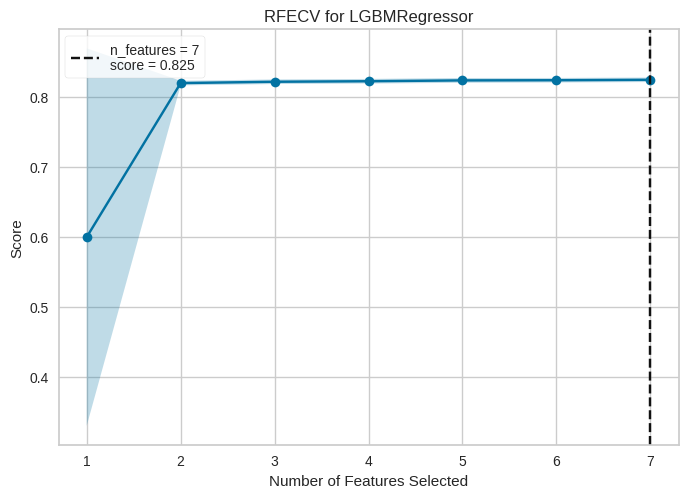

In [203]:
plot_model(lgbm,plot='rfe')

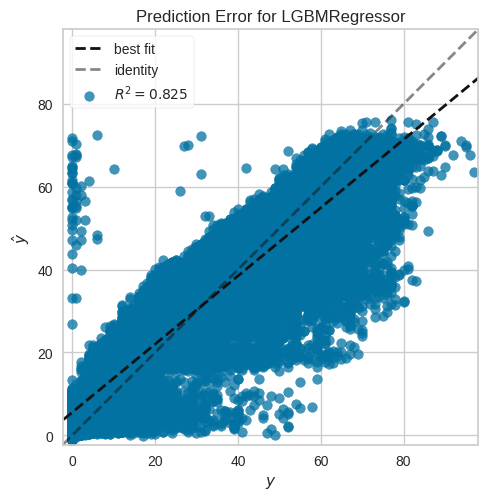

In [204]:
plot_model(lgbm, plot='error')

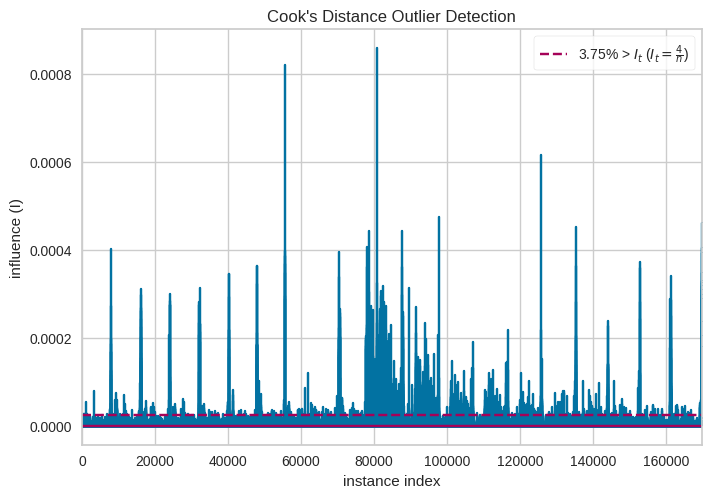

In [205]:
plot_model(lgbm, plot='cooks')

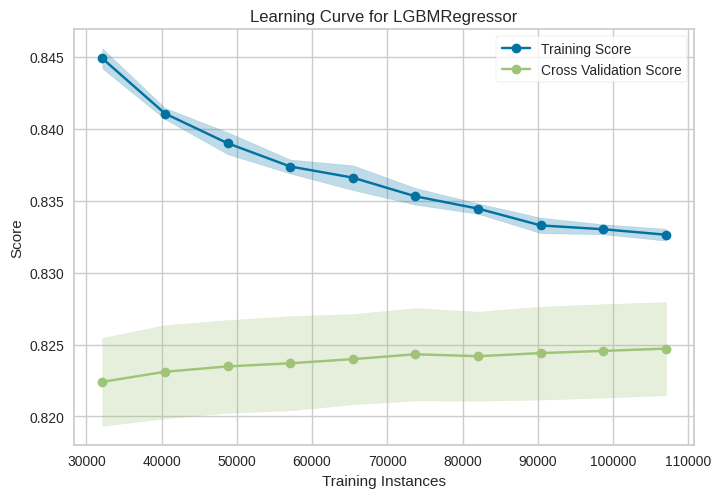

In [206]:
plot_model(lgbm, plot='learning')


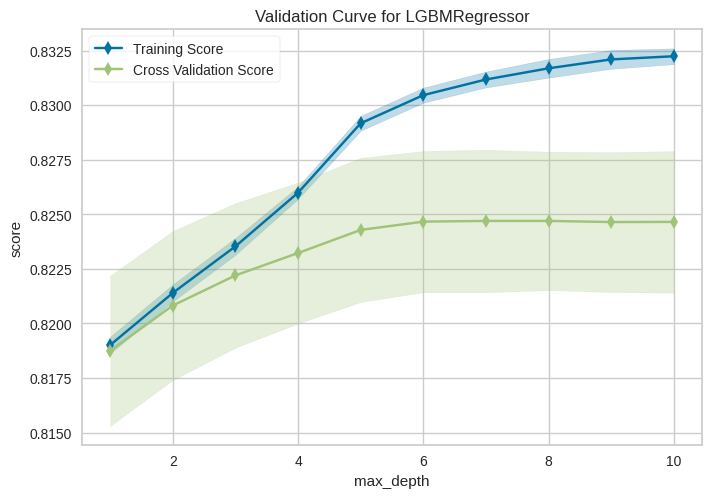

In [207]:
plot_model(lgbm, plot='vc')


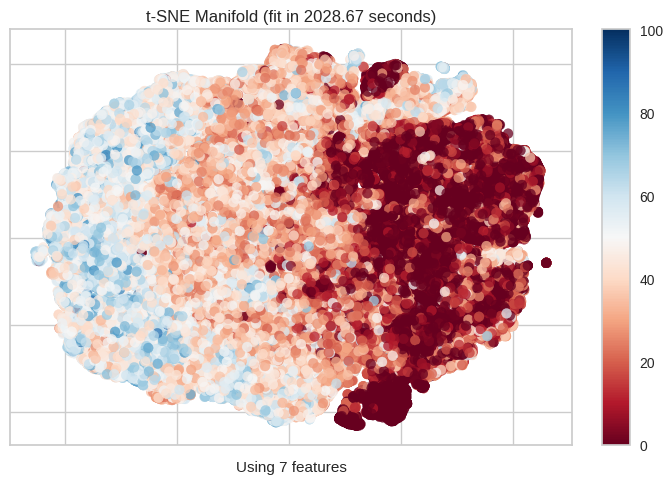

In [208]:
plot_model(lgbm, plot='manifold')


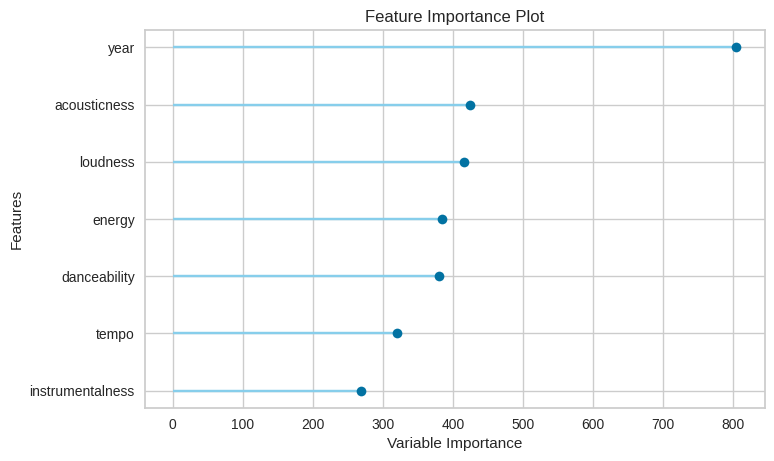

In [209]:
plot_model(lgbm, plot='feature')


In [210]:
plot_model(lgbm, plot='parameter')

,Parameters
boosting_type,gbdt
class_weight,None
colsample_bytree,1
importance_type,split
learning_rate,0.1
max_depth,-1
min_child_samples,20
min_child_weight,0.001
min_split_gain,0
n_estimators,100
